In [2]:
import pickle
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from art.attacks.evasion import FastGradientMethod, ProjectedGradientDescent, DeepFool
from art.defences.trainer import AdversarialTrainer
from art.estimators.classification import PyTorchClassifier
from keras.utils import img_to_array
from keras.utils import load_img
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torchvision.models import resnet18

2023-05-12 18:18:28.914826: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-12 18:18:29.650543: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/cpssface/anaconda3/envs/tf/lib/:/home/cpssface/anaconda3/envs/tf/lib/python3.11/site-packages/nvidia/cudnn/lib:/home/cpssface/anaconda3/envs/tf/lib/:/home/cpssface/anaconda3/envs/tf/lib/python3.11/site-packages/nvidia/cudnn/lib:/home/cpssface/anaconda3/envs/tf/lib/:/home/cpssface/anaconda3/envs/tf/lib/python3.11/site-packages/nvidia/cudnn/lib
2023-05-12 18:18:29.650672: W tensorflow/compiler

# Adversarial Training Defense

# load data

In [3]:
labels_ori = pd.read_csv('labels_paintings.csv', header=None)
images = [img_to_array(load_img('Paintings/' + i, target_size=(224, 224))) for i in
          os.listdir('Paintings')]

In [4]:
label_binarizer = LabelBinarizer()
labels = label_binarizer.fit_transform(labels_ori)

In [ ]:
assert len(images) == len(labels)
with open('paintings.pickle', 'wb') as f:
    pickle.dump((images, labels), f)

In [ ]:
with open('paintings.pickle', 'rb') as f:
    images, labels = pickle.load(f)

In [5]:
images = np.array(images) / 255.0
images.max()

1.0

### plot 9 images with ground-truth labels

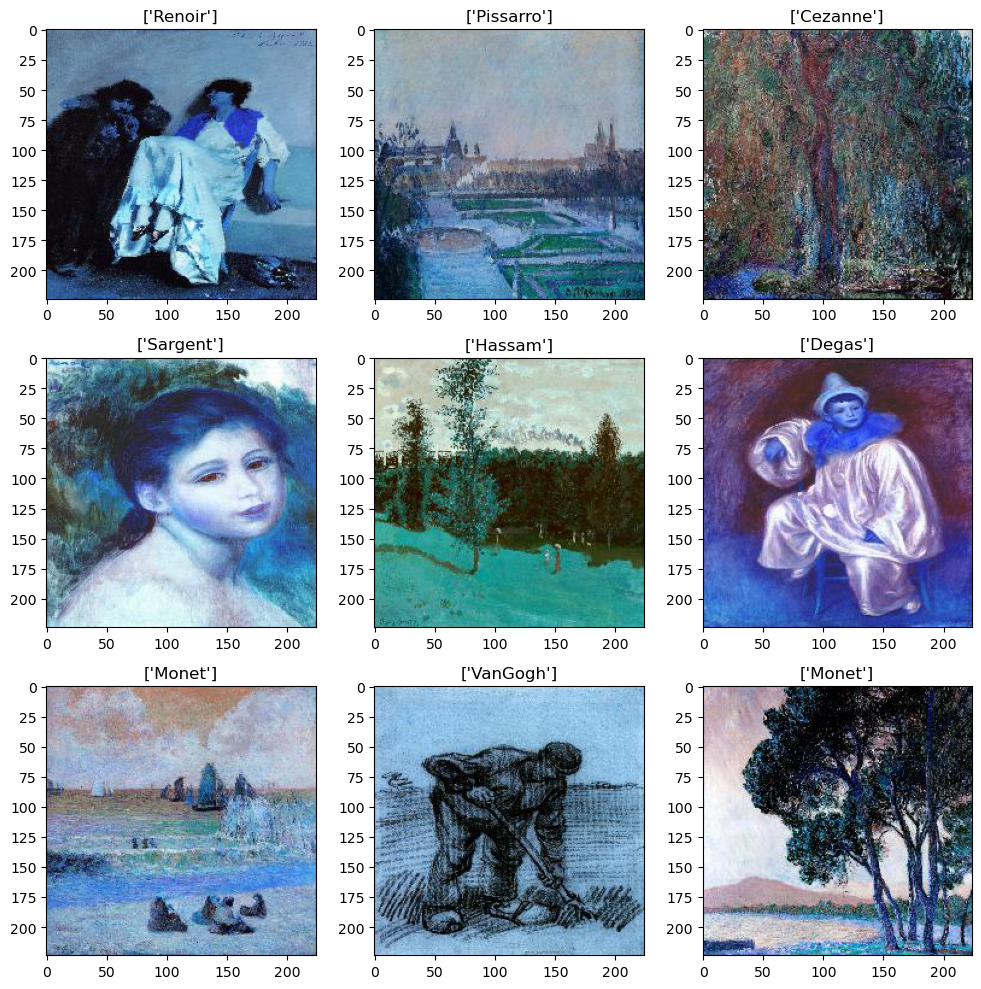

In [6]:
fig, ax = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
    for j in range(3):
        idx = np.random.randint(len(images))
        ax[i, j].imshow(images[idx])
        ax[i, j].set_title(np.array(labels_ori)[idx])
plt.tight_layout()
plt.show()

### train model

In [7]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.resnet = resnet18(pretrained=True)
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(64 * 56 * 56, 128)
        self.fc2 = nn.Linear(128, 10)
        self.fc3 = nn.Linear(128, 128)
        self.resnet.fc=nn.Linear(self.resnet.fc.in_features,128)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        # x = self.pool(nn.functional.relu(self.conv1(x)))
        # x = self.pool(nn.functional.relu(self.conv2(x)))
        # x = x.reshape(x.size(0), -1)
        # x = nn.functional.relu(self.fc1(x))
        # x = self.dropout(x)
        # x = self.fc2(x)
        x=self.resnet(x)
        x = self.dropout(x)
        x = self.fc3(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [8]:
class MyDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        if self.transform is not None:
            image = self.transform(image)
        return image, label

In [49]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_train, X_val, y_train, y_val = train_test_split(torch.from_numpy(images).permute(0, 3, 1, 2),labels, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, test_size=0.5, random_state=42)
transf = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
lr = 4e-6
batch_size = 16
num_epochs = 30

In [51]:
train_dataset = MyDataset(images=X_train, labels=y_train,
                          transform=transf)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataset = MyDataset(images=X_val, labels=y_val,
                        transform=transf)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataset = MyDataset(images=X_test, labels=y_test,
                        transform=transf)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

model = Net().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=lr)
train_loss_history = []
train_acc_history = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for batches, targets in train_dataloader:
        targets = targets.float()
        batches, targets = batches.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = model(batches)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * batches.size(0)
        # _, predicted = torch.max(outputs.data, 1)
        # _, y_true = torch.max(targets.data, 1)
        # total += targets.size(0)
        # correct += (predicted == y_true).sum().item()
    for batches, targets in val_dataloader:
        model.eval()
        targets = targets.float()
        batches, targets = batches.to(device), targets.to(device)
        outputs = model(batches)
        _, predicted = torch.max(outputs.data, 1)
        _, y_true = torch.max(targets.data, 1)
        total += targets.size(0)
        correct += (predicted == y_true).sum().item()
    epoch_loss = running_loss / len(train_dataset)
    epoch_acc = correct / total

    train_loss_history.append(epoch_loss)
    train_acc_history.append(epoch_acc)

    print('Epoch {}/{} - train loss: {:.4f} - val acc: {:.4f}'.format(epoch + 1, num_epochs, epoch_loss,
                                                            epoch_acc))

Epoch 1/30 - train loss: 2.3729 - val acc: 0.1266
Epoch 2/30 - train loss: 2.3575 - val acc: 0.1341
Epoch 3/30 - train loss: 2.3413 - val acc: 0.1617
Epoch 4/30 - train loss: 2.3205 - val acc: 0.1754
Epoch 5/30 - train loss: 2.3091 - val acc: 0.1905
Epoch 6/30 - train loss: 2.3072 - val acc: 0.2130
Epoch 7/30 - train loss: 2.2988 - val acc: 0.2444
Epoch 8/30 - train loss: 2.2816 - val acc: 0.2619
Epoch 9/30 - train loss: 2.2698 - val acc: 0.2832
Epoch 10/30 - train loss: 2.2639 - val acc: 0.3095
Epoch 11/30 - train loss: 2.2515 - val acc: 0.3308
Epoch 12/30 - train loss: 2.2318 - val acc: 0.3509
Epoch 13/30 - train loss: 2.2202 - val acc: 0.3596
Epoch 14/30 - train loss: 2.2083 - val acc: 0.3910
Epoch 15/30 - train loss: 2.1950 - val acc: 0.4386
Epoch 16/30 - train loss: 2.1783 - val acc: 0.4524
Epoch 17/30 - train loss: 2.1684 - val acc: 0.4850
Epoch 18/30 - train loss: 2.1547 - val acc: 0.4962
Epoch 19/30 - train loss: 2.1333 - val acc: 0.5175
Epoch 20/30 - train loss: 2.1222 - val a

In [54]:
torch.save(model.state_dict(), 'paintings_model.pth')
model.load_state_dict(torch.load('paintings_model.pth'))

<All keys matched successfully>

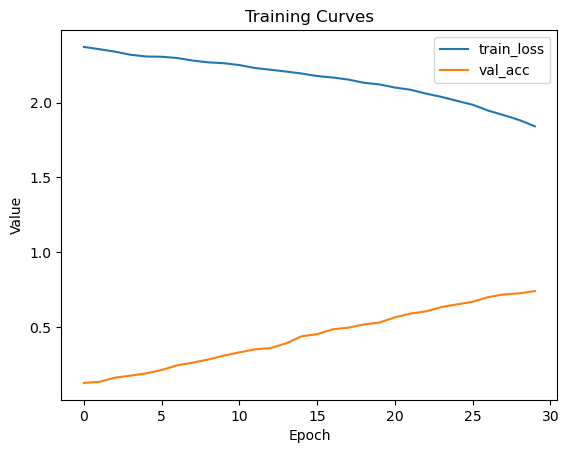

In [55]:
plt.plot(train_loss_history, label='train_loss')
plt.plot(train_acc_history, label='val_acc')
plt.title('Training Curves')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()

In [60]:
test_dataset = MyDataset(images=X_test, labels=y_test,
                        transform=transf)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)
with torch.no_grad():
    correct = 0
    total = 0
    for batches, targets in test_dataloader:
        model.eval()
        targets = targets.float()
        batches, targets = batches.to(device), targets.to(device)
        outputs = model(batches)
        _, predicted = torch.max(outputs.data, 1)
        _, y_true = torch.max(targets.data, 1)
        total += targets.size(0)
        correct += (predicted == y_true).sum().item()
    print('test acc: {:.2f}%'.format(correct/total *100))

test acc: 75.44%


generate samples with FGSM SGD Deep Fool.

In [28]:
num_images = len(X_val)
testset = [(X_val[i], y_val[i]) for i in range(num_images)]
indices = np.random.choice(num_images, size=100, replace=False)
subset = torch.utils.data.Subset(testset, indices)

In [30]:
model = model.cpu()
classifier = PyTorchClassifier(model=model, loss=nn.CrossEntropyLoss(),
                               input_shape=(3, 224, 224), nb_classes=10)
eps = 20 / 255.0
fgsm_attack = FastGradientMethod(classifier, eps=eps)
pgd_attack = ProjectedGradientDescent(classifier, eps=eps, eps_step=2 / 255.0)
deepfool_attack = DeepFool(classifier)
img, label = X_val[indices], y_val[indices]
fgsm_adv = fgsm_attack.generate(x=np.array(img), device='cpu')
pgd_adv = pgd_attack.generate(x=np.array(img), device='cpu')
deepfool_adv = deepfool_attack.generate(x=np.array(img), device='cpu')
model = model.cpu()
fgsm_adv = fgsm_adv.squeeze()
pgd_adv = pgd_adv.squeeze()
deepfool_adv = deepfool_adv.squeeze()
f_pred=torch.argmax(model(torch.from_numpy(fgsm_adv)),dim=1)
p_pred=torch.argmax(model(torch.from_numpy(pgd_adv)),dim=1)
d_pred=torch.argmax(model(torch.from_numpy(deepfool_adv)),dim=1)
print(f'FGSM acc:{torch.sum(f_pred==torch.argmax(torch.tensor(label),dim=1))}%, PGD acc:{torch.sum(p_pred==torch.argmax(torch.tensor(label),dim=1))}%, DF acc:{torch.sum(p_pred==torch.argmax(torch.tensor(label),dim=1))}%')

PGD - Batches:   0%|          | 0/4 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/100 [00:00<?, ?it/s]

FGSM acc:8%, PGD acc:10%, DF acc:10%


PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipykernel_870571/4007124729.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tt = torch.tensor(img).unsqueeze(0)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


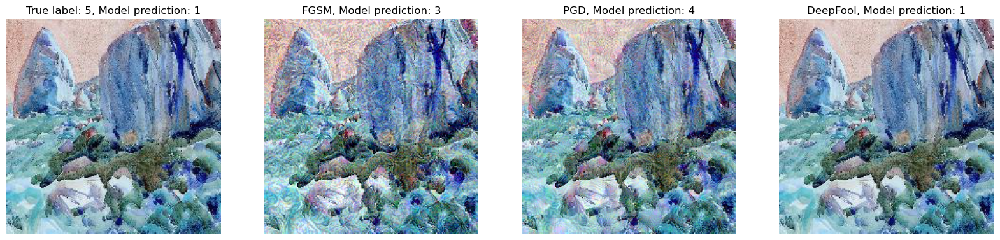

PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


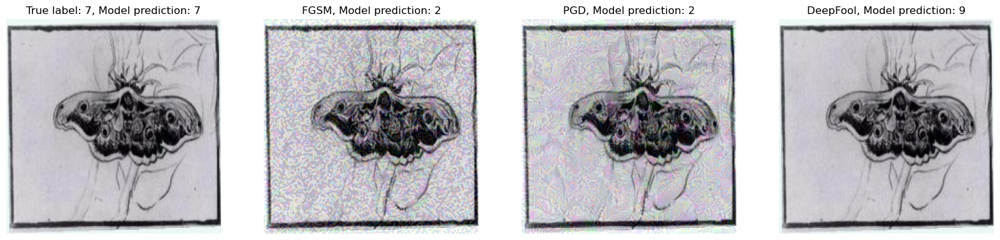

PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


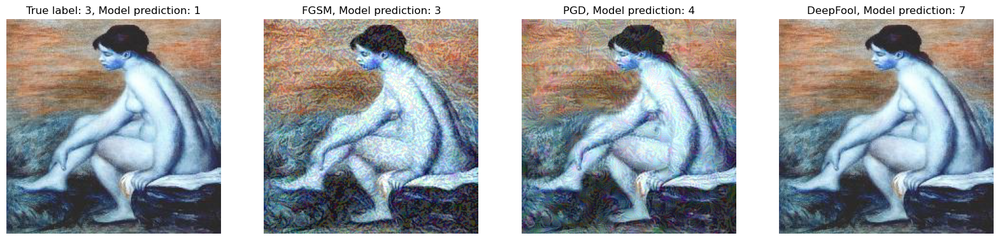

PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


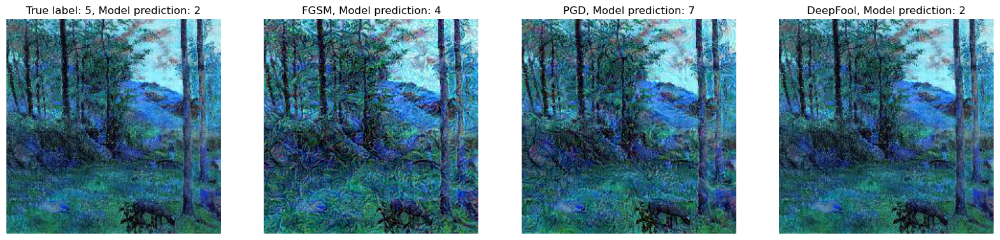

PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


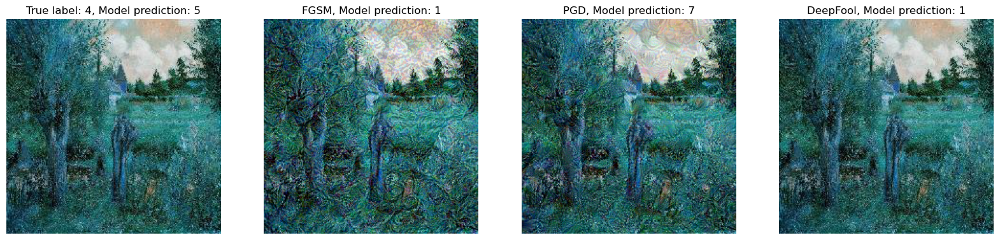

PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


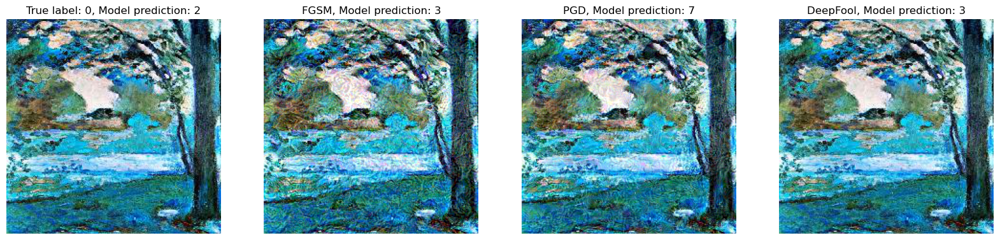

PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


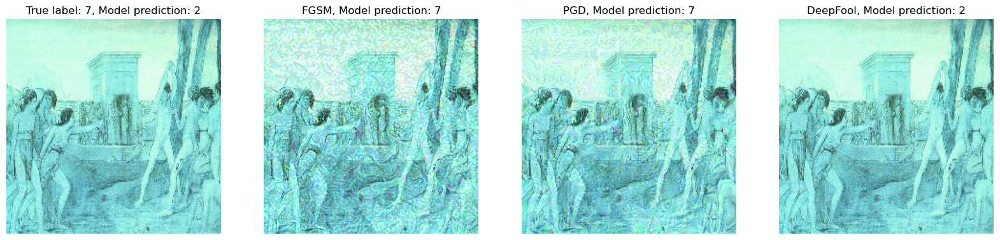

PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


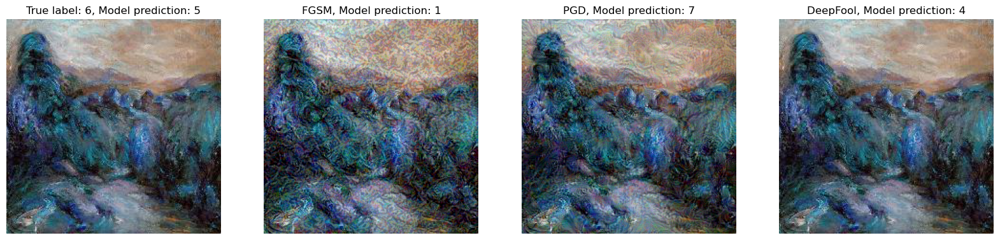

PGD - Batches:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


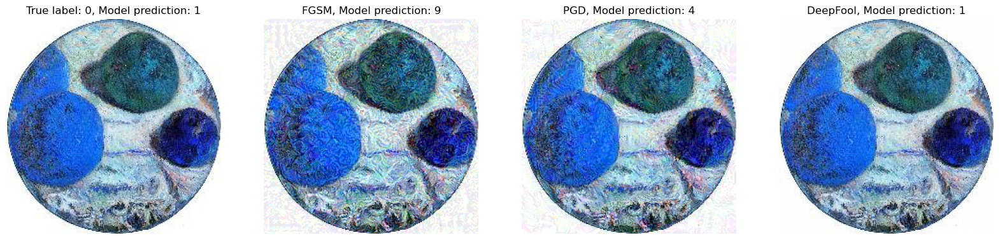

In [31]:
for i in range(9):
    model = model.cpu()
    classifier = PyTorchClassifier(model=model, loss=nn.CrossEntropyLoss(),
                                   input_shape=(3, 224, 224), nb_classes=10)
    eps = 20 / 255.0
    fgsm_attack = FastGradientMethod(classifier, eps=eps)
    pgd_attack = ProjectedGradientDescent(classifier, eps=eps, eps_step=2 / 255.0)
    deepfool_attack = DeepFool(classifier)
    idx = np.random.choice(num_images, replace=False)
    img, label = X_val[idx], y_val[idx]
    fgsm_adv = fgsm_attack.generate(x=np.array(img.unsqueeze(0)), device='cpu')
    pgd_adv = pgd_attack.generate(x=np.array(img.unsqueeze(0)), device='cpu')
    deepfool_adv = deepfool_attack.generate(x=np.array(img.unsqueeze(0)), device='cpu')

    model = model.cpu()
    fgsm_adv = fgsm_adv.squeeze(0).transpose(1, 2, 0)
    pgd_adv = pgd_adv.squeeze(0).transpose(1, 2, 0)
    deepfool_adv = deepfool_adv.squeeze(0).transpose(1, 2, 0)

    plt.figure(figsize=(20, 20))
    plt.subplot(1, 4, 1)
    plt.imshow(img.squeeze(0).permute(1, 2, 0))
    tt = torch.tensor(img).unsqueeze(0)
    plt.title(f'True label: {np.argmax(label)}, Model prediction: {torch.argmax(model(tt))}')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(fgsm_adv)
    plt.title(
        f'FGSM, Model prediction: {torch.argmax(model(torch.from_numpy(fgsm_adv).permute(2, 0, 1).unsqueeze(0)))}')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(pgd_adv)
    plt.title(
        f'PGD, Model prediction: {torch.argmax(model(torch.from_numpy(pgd_adv).permute(2, 0, 1).unsqueeze(0)))}')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(deepfool_adv)
    plt.title(
        f'DeepFool, Model prediction: {torch.argmax(model(torch.from_numpy(deepfool_adv).permute(2, 0, 1).unsqueeze(0)))}')
    plt.axis('off')
    plt.show()

In [32]:
classifier = PyTorchClassifier(
    model=model,
    clip_values=(0, 1),
    loss=torch.nn.CrossEntropyLoss(),
    optimizer=torch.optim.Adam(model.parameters(), lr=0.001),
    input_shape=(3, 224, 224),
    nb_classes=10,
)

# Choose the attack to use for Adversarial Training
# fgsm = FastGradientMethod(classifier, eps=0.08)
pgd = ProjectedGradientDescent(classifier, eps=0.08, eps_step=0.01, max_iter=40)

# Create an AdversarialTrainer with the chosen attack
adversarial_trainer = AdversarialTrainer(
    classifier=classifier,
    attacks=pgd,
    ratio=0.5,
)

# Train the model with Adversarial Training
adversarial_trainer.fit(np.array(X_train), y_train, nb_epochs=10)


Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/10 [00:00<?, ?it/s]

In [57]:
correct = 0
total = 0
val_dataset = MyDataset(images=X_val, labels=y_val,
                        transform=transf)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
model = model.cpu()
with torch.no_grad():
    for batches, targets in val_dataloader:
        outputs = model(batches)
        _, predicted = torch.max(outputs.data, 1)
        _, y_true = torch.max(targets.data, 1)
        total += targets.size(0)
        correct += (predicted == y_true).sum().item()

clean_accuracy = 100 * correct / total
print('Clean accuracy: {:.2f}%'.format(clean_accuracy))
correct = 0
total = 0
eps = 20 / 255.0
for batches, targets in val_dataloader:
    model = model.cpu()
    classifier = PyTorchClassifier(model=model, loss=nn.CrossEntropyLoss(),
                                   input_shape=(3, 224, 224), nb_classes=10)
    fgsm_attack = FastGradientMethod(classifier, eps=eps)
    adversarial_images = fgsm_attack.generate(x=np.array(batches), device='cpu')
    adversarial_images = torch.from_numpy(adversarial_images)
    model = model.cpu()
    outputs = model(adversarial_images)
    _, predicted = torch.max(outputs.data, 1)
    _, y_true = torch.max(targets.data, 1)
    total += targets.size(0)
    correct += (predicted == y_true).sum().item()
adv_accuracy = 100 * correct / total
print('Adversarial accuracy: {:.2f}%'.format(adv_accuracy))

Clean accuracy: 74.06%
Adversarial accuracy: 1.75%
